## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrixand distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixelsand fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Compute the camera calibration using chessboard images

In [1]:
# Importing libraries
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt

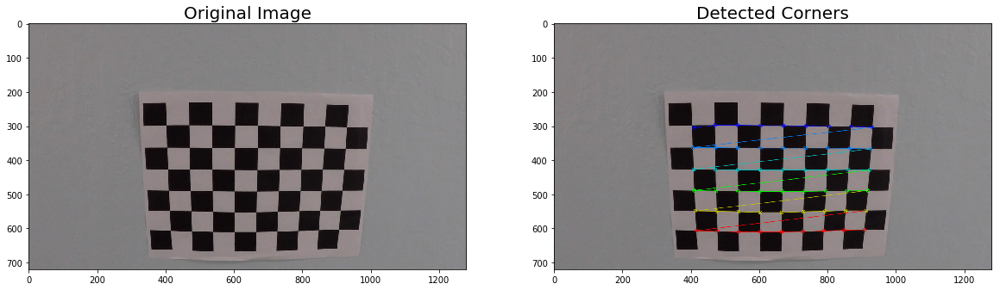

In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.
f,ax = plt.subplots(1, 2, figsize=(20,10))
# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for count, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
    # Find the chessboard corners
    if (count==5):
        ax[0].set_title('Original Image', fontsize=20)
        ax[0].imshow(img)
        
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        if (count==5):
            ax[1].set_title('Detected Corners', fontsize=20)
            ax[1].imshow(img)


## Undistortion of the images

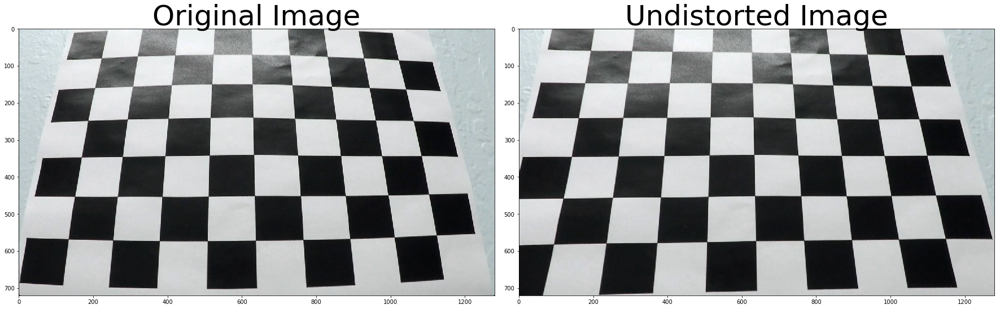

In [3]:
def cal_undistort(img):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist


img = cv2.imread('camera_cal/calibration3.jpg')
undistorted = cal_undistort(img)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Apply a distortion correction to All test images.

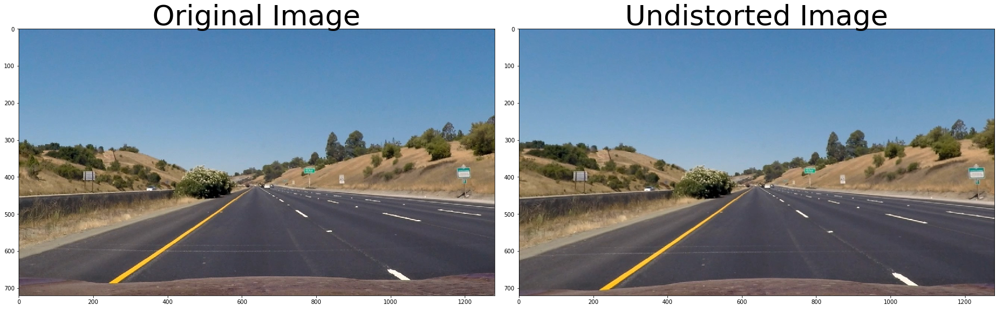

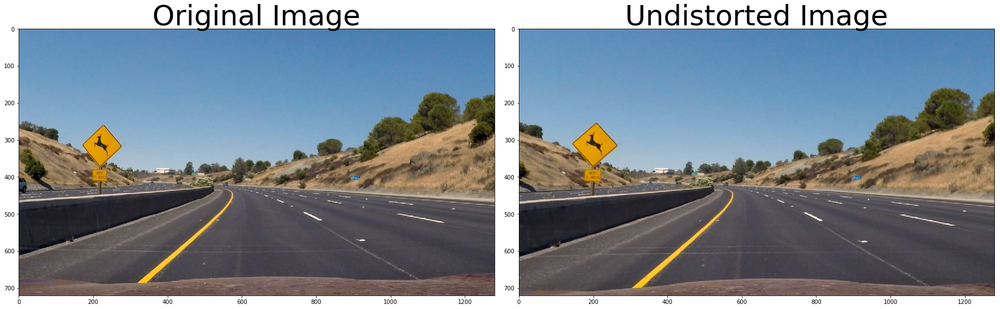

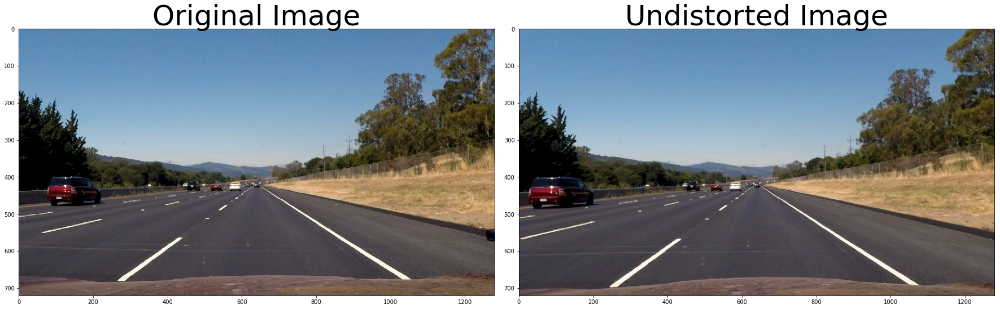

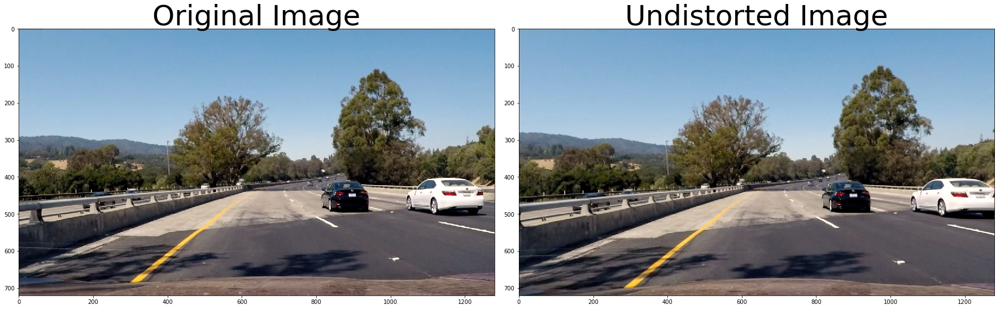

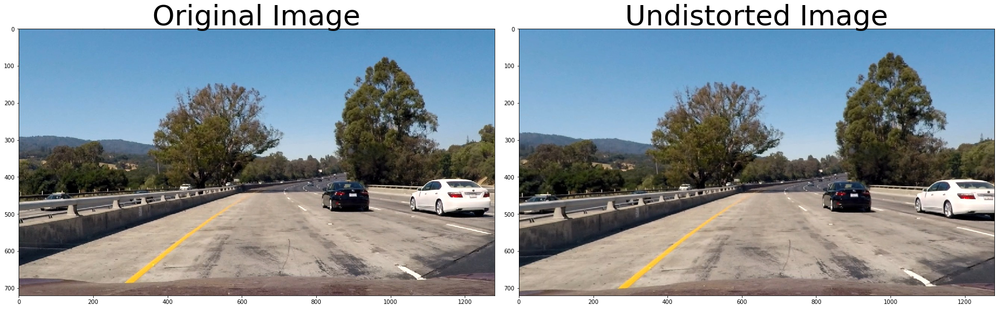

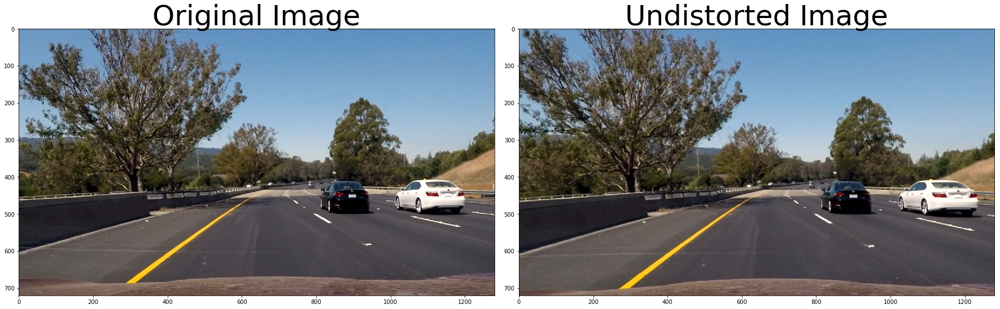

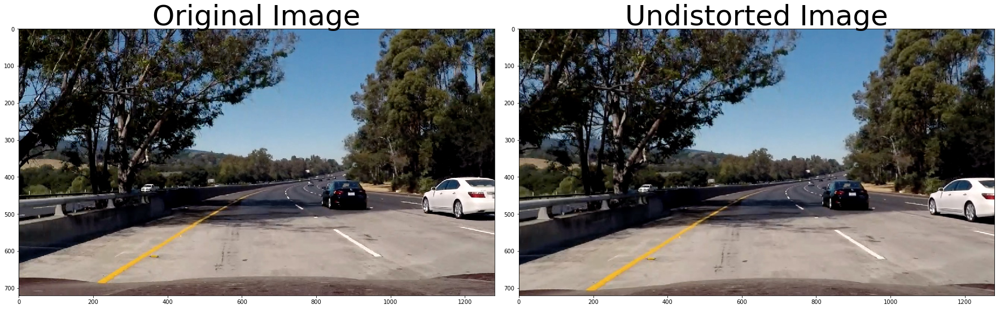

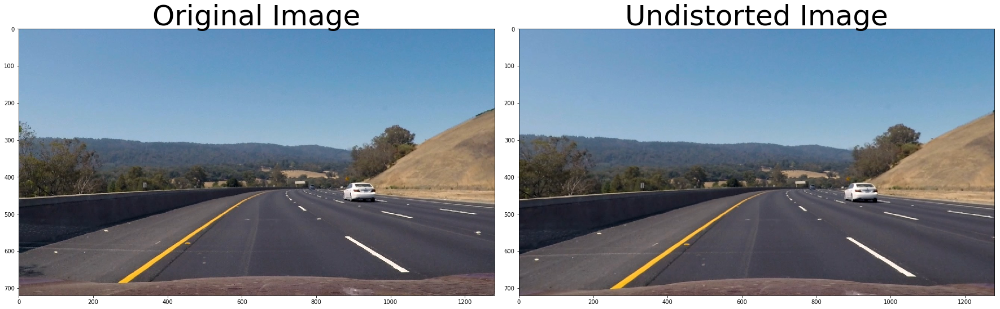

In [4]:
images = glob.glob('test_images/*.jpg')

for fname in images:
    img = cv2.imread(fname)
    img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    undistorted = cal_undistort(img)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    
    
    

## Use color transforms, gradients, etc., to create a thresholded binary image.

In [22]:
def abs_sobel_thresh(img, orient='x', mag_thresh=(0,255)):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0,255)):
    gray =cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    return binary_output

def combined_gradthresh(image): 
    ksize=3
    gradx = abs_sobel_thresh(image, orient='x', mag_thresh=(20, 100))
    grady = abs_sobel_thresh(image, orient='y', mag_thresh=(20, 100))
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 100))
    dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return gradx

def gray(image)
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    binary = np.zeros_like(gray)
    binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1
    return(binary)
def R_thresh(image):
    R=image[:,:,0]
    thresh = (180, 255)
    R_binary = np.zeros_like(R)
    R_binary[(R > thresh[0]) & (R <= thresh[1])] = 1
    return R_binary
def S_binary(image) :
    hls=cv2.cvtColor(image,cv2.COLOR_RGB2HLS)
    S=hls[:,:,2]
    thresh = (170, 255)
    S_binary = np.zeros_like(S)
    S_binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    return S_binary

def H_binary(image):
    hls=cv2.cvtColor(image,cv2.COLOR_RGB2HLS)
    H=hls[:,:,0]
    thresh = (180, 255)
    H_binary = np.zeros_like(H)
    H_binary[(H > thresh[0]) & (H <= thresh[1])] = 1
    return H_binary

def L_binary(image):
    hls=cv2.cvtColor(image,cv2.COLOR_RGB2HLS)
    L=hls[:,:,1]
    thresh = (180, 255)
    L_binary = np.zeros_like(L)
    L_binary[(L > thresh[0]) & (L <= thresh[1])] = 1
    return L_binary
    
def combined_finalbinarythresh(image):
    image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    R = R_thresh(image)
    S = S_binary(image)
    ksize=3
    combined_grad=combined_gradthresh(image)
    gradx = abs_sobel_thresh(image, orient='x', mag_thresh=(20, 100))
    grady = abs_sobel_thresh(image, orient='y', mag_thresh=(20, 100))
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(20, 100))
    dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.4))
    gray=gray(image)
    combined_binary = np.zeros_like(gradx)
    combined_binary[((gradx==1) & (grady==1)) | ((mag_binary==1) & (dir_binary==1))| (S==1)|(R==1)|(gray==1)] = 1
    return combined_binary

SyntaxError: invalid syntax (<ipython-input-22-13734abd202d>, line 42)

Text(0.5,1,'Combined')

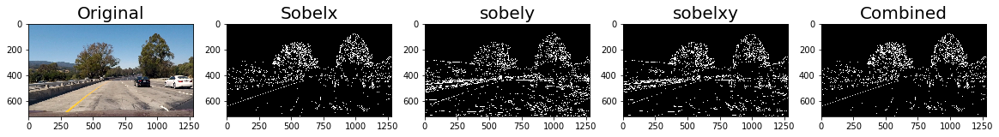

In [23]:
image = cv2.imread('test_images/test1.jpg')
combined=combined_gradthresh(image)
fig, axes= plt.subplots(1,5,figsize=(20,20))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
axes[0].imshow(image)
axes[0].set_title("Original", fontsize=20)
gradx = abs_sobel_thresh(image, orient='x', mag_thresh=(20, 100))
axes[1].imshow(gradx, cmap='gray')
axes[1].set_title("Sobelx", fontsize=20)
grady = abs_sobel_thresh(image, orient='y', mag_thresh=(20, 100))
axes[2].imshow(grady, cmap='gray')
axes[2].set_title("sobely", fontsize=20)
mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))
axes[3].imshow(mag_binary, cmap='gray')
axes[3].set_title("sobelxy", fontsize=20)
#dir_binary = dir_threshold(image, sobel_kernel=3, thresh=(0.7, 1.3))
combined=combined_gradthresh(image)
axes[4].imshow(combined, cmap='gray')
axes[4].set_title("Combined", fontsize=20)

Text(0.5,1,'L')

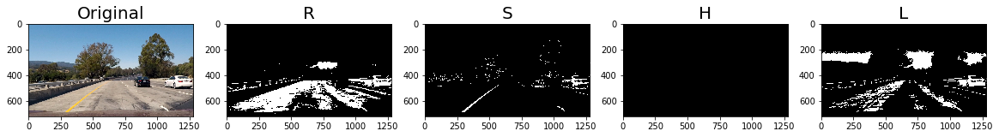

In [24]:
image = cv2.imread('test_images/test1.jpg')
fig, axes= plt.subplots(1,5,figsize=(20,20))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
axes[0].imshow(image)
axes[0].set_title("Original", fontsize=20)
R = R_thresh(image)
axes[1].imshow(R, cmap='gray')
axes[1].set_title("R", fontsize=20)
S= S_binary(image)
axes[2].imshow(S, cmap='gray')
axes[2].set_title("S", fontsize=20)
H=H_binary(image)
axes[3].imshow(H, cmap='gray')
axes[3].set_title("H", fontsize=20)
L=L_binary(image)
axes[4].imshow(L, cmap='gray')
axes[4].set_title("L", fontsize=20)

Text(0.5,1,'Original')

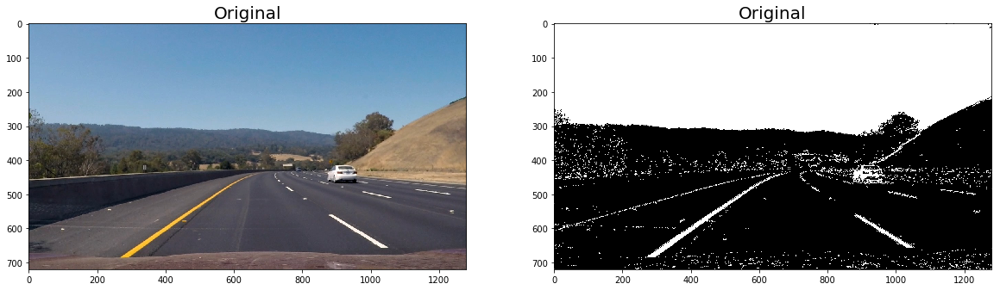

In [25]:
image = cv2.imread('test_images/test3.jpg')
image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
outputimg=combined_finalbinarythresh(image)
fig, axes= plt.subplots(1,2,figsize=(20,20))
axes[0].imshow(image)
axes[0].set_title("Original", fontsize=20)
axes[1].imshow(outputimg, cmap='gray')
axes[1].set_title("Original", fontsize=20)


## Apply a perspective transform to rectify binary image ("birds-eye view").

In [26]:
def warp_img(img):
    img_size=(img.shape[1],img.shape[0])
    #src=np.float32([[220,720],[1110,720],[722,400],[570,400]]) # Source Points for Image Warp
    #dst= np.float32([[320 ,720], [920  ,720], [920 ,1], [320 ,1]]) # Destination Points for Image Warp
    
    src=np.float32([[150,720],[590,450],[700,450],[1250,720]]) # Source Points for Image Warp
    dst= np.float32([[200 ,720], [200  ,0], [980 ,0], [980 ,720]]) # Destination Points for Image Warp
    M = cv2.getPerspectiveTransform(src, dst)
    #Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped

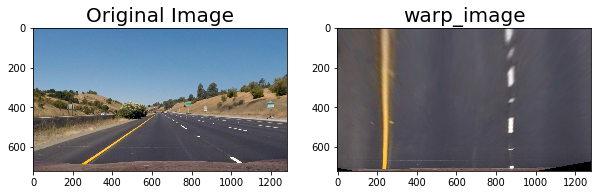

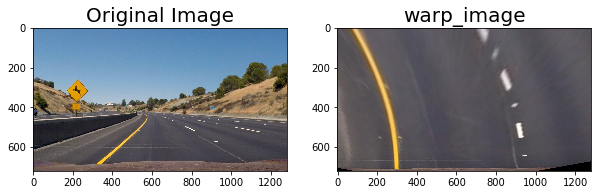

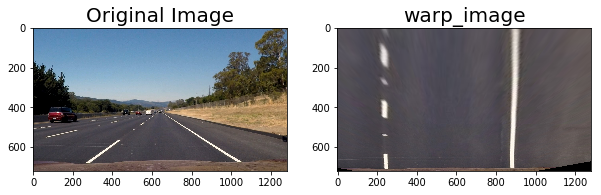

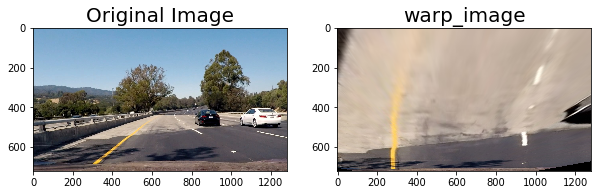

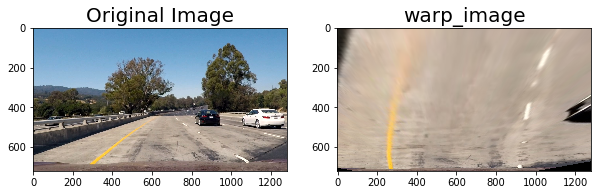

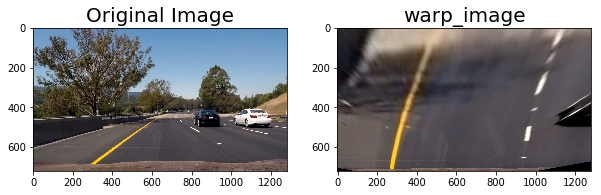

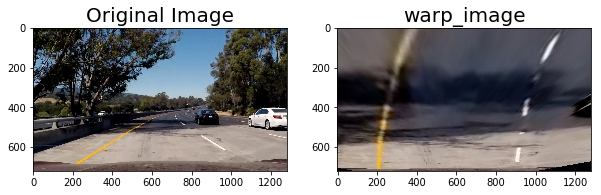

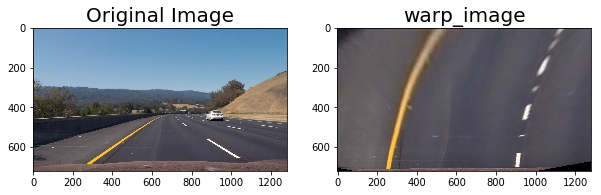

In [27]:
warpped_Images=[]
images = glob.glob('test_images/*.jpg')

for fname in images:
    img = cv2.imread(fname)
    img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    warp_image=warp_img(img)
    warpped_Images.append(warp_image)
    f,ax = plt.subplots(1, 2, figsize=(10,10))
    ax[0].set_title('Original Image', fontsize=20)
    ax[0].imshow(img)
    ax[1].set_title('warp_image', fontsize=20)
    ax[1].imshow(warp_image)

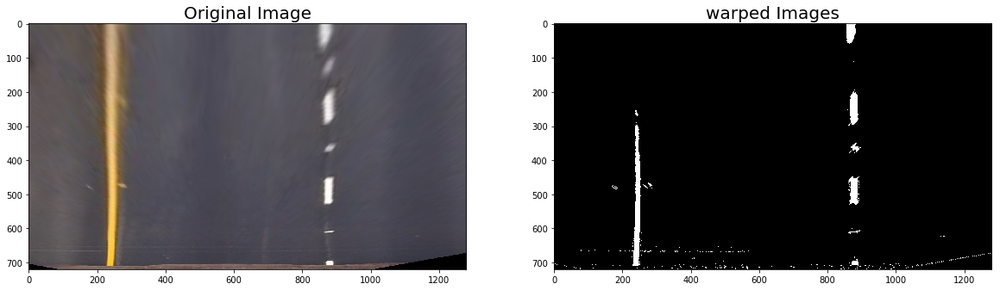

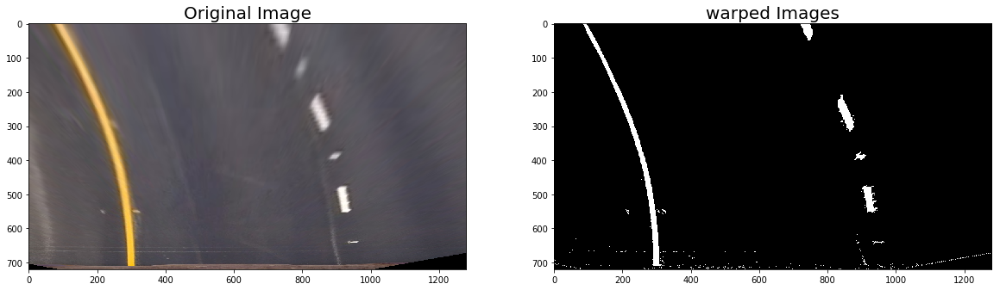

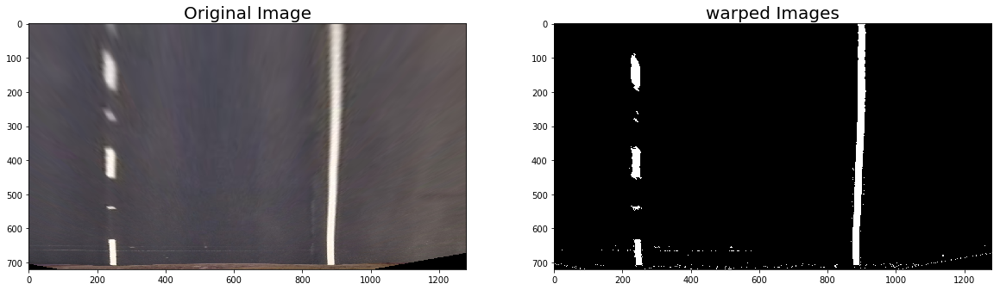

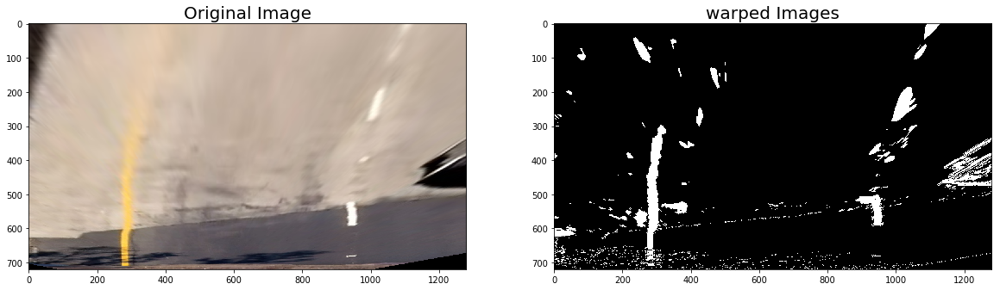

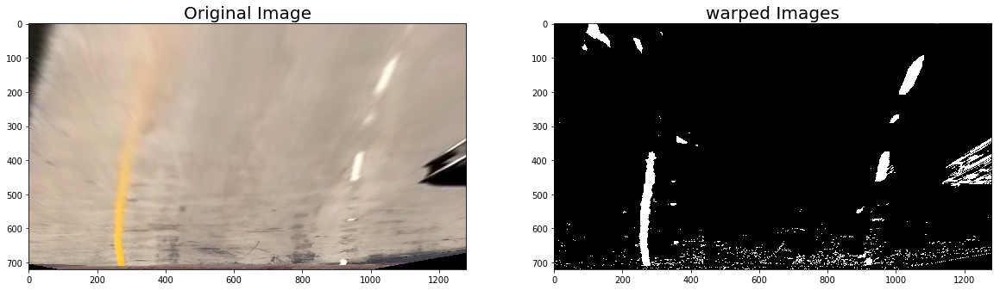

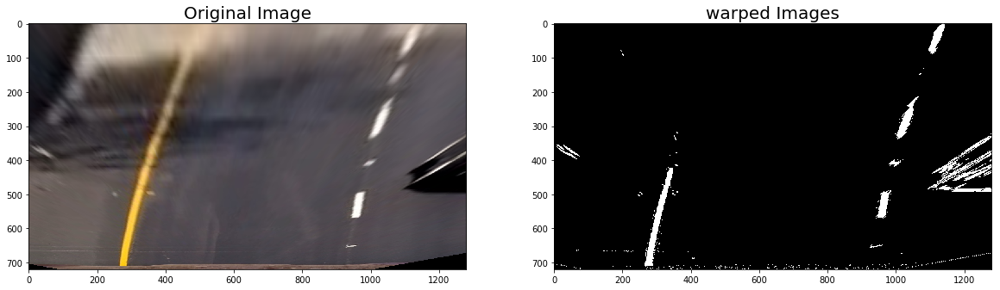

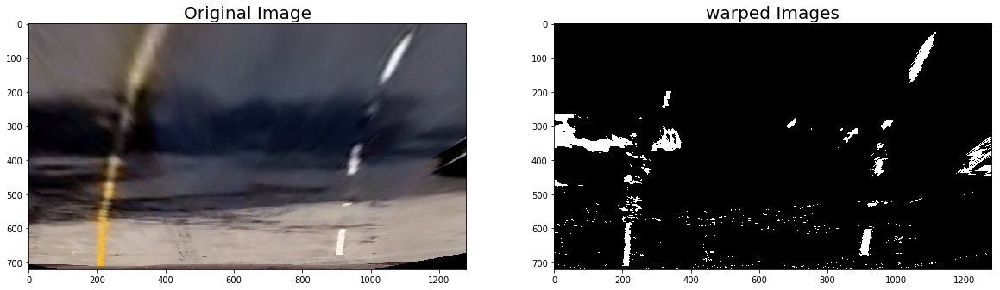

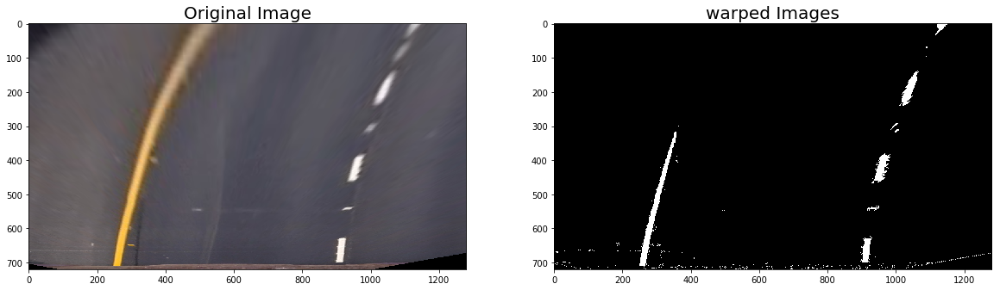

In [28]:
#Afetr applying all thresholds to the warped images we get ....
for index, images in enumerate(warpped_Images):
    output=combined_finalbinarythresh(images)
    f,ax = plt.subplots(1, 2, figsize=(20,10))
    ax[0].set_title('Original Image', fontsize=20)
    ax[0].imshow(images)
    ax[1].set_title('warped Images', fontsize=20)
    ax[1].imshow(output, cmap='gray')
    
    

In [29]:

def hist(warpedimage):
    return np.sum(warpedimage[warpedimage.shape[0]//2:,:], axis=0)

Text(0.5,1,'Histogram')

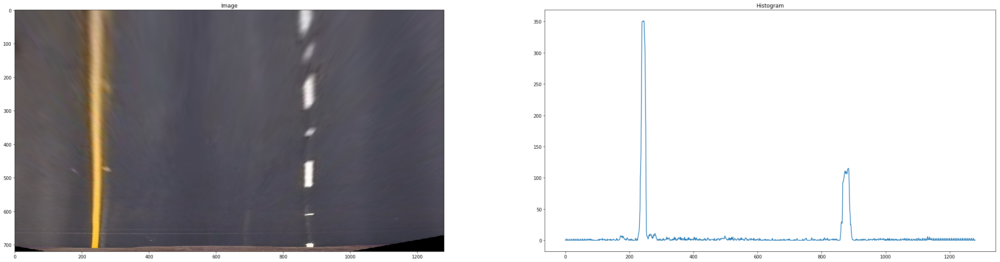

In [30]:
fig, axes= plt.subplots(1,2,figsize=(40,10))
img= warpped_Images[0]
axes[0].imshow(img,cmap='gray')
axes[0].set_title("Image")
combinedImage=combined_finalbinarythresh(img)
histogram = hist(combinedImage)
axes[1].plot(histogram)
axes[1].set_title("Histogram")

In [31]:
def window_search(binary, plot=False):

    histogram = hist(binary)
    
    # Create an output image to draw on
    out_img = np.dstack((binary, binary, binary))*255
    
    # Find the peak of the left and right halves of the histogram which will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    left_x_base = np.argmax(histogram[:midpoint])
    right_x_base = np.argmax(histogram[midpoint:]) + midpoint

    # Number of sliding windows
    n = 9
    
    # Height of windows
    window_height = np.int(binary.shape[0]/n) 
    
    # Identify the x and y positions of all nonzero pixels
    nonzero = binary.nonzero()
    nonzero_y = np.array(nonzero[0])
    nonzero_x = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    left_x_current = left_x_base
    right_x_current = right_x_base
    
    # Width of the windows +/- margin
    margin = 100
    
    # Minimum number of pixels found to recenter window
    min_pixels = 50
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane = []
    right_lane = []

    # Step through the windows one by one
    for window in range(n):
        
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary.shape[0] - (window+1)*window_height
        win_y_high = binary.shape[0] - window*window_height
        win_x_left_low = left_x_current - margin
        win_x_left_high = left_x_current + margin
        win_x_right_low = right_x_current - margin
        win_x_right_high = right_x_current + margin
        
        # Draw the windows on the visualization image
        if(plot==True):
            cv2.rectangle(out_img,(win_x_left_low,win_y_low),(win_x_left_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_x_right_low,win_y_low),(win_x_right_high,win_y_high),(0,255,0), 2) 
            
        # Identify the nonzero pixels in x and y within the window
        good_left = ((nonzero_y >= win_y_low) & (nonzero_y < win_y_high) & 
        (nonzero_x >= win_x_left_low) &  (nonzero_x < win_x_left_high)).nonzero()[0]
        good_right = ((nonzero_y >= win_y_low) & (nonzero_y < win_y_high) & 
        (nonzero_x >= win_x_right_low) &  (nonzero_x < win_x_right_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane.append(good_left)
        right_lane.append(good_right)
        
        # If you found > min_pixels pixels, recenter next window on their mean position
        if len(good_left) > min_pixels:
            left_x_current = np.int(np.mean(nonzero_x[good_left]))
        if len(good_right) > min_pixels:        
            right_x_current = np.int(np.mean(nonzero_x[good_right]))

    # Concatenate the arrays of indices
    left_lane = np.concatenate(left_lane)
    right_lane = np.concatenate(right_lane)

    # Extract left and right line pixel positions
    left_x = nonzero_x[left_lane]
    left_y = nonzero_y[left_lane] 
    right_x = nonzero_x[right_lane]
    right_y = nonzero_y[right_lane] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(left_y, left_x, 2)
    right_fit = np.polyfit(right_y, right_x, 2)

    return left_fit,right_fit,left_lane,right_lane,out_img

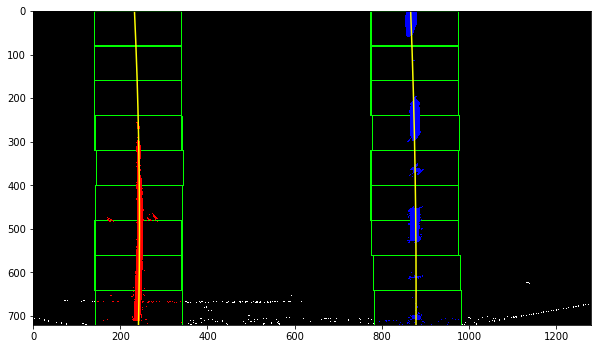

In [32]:
def visualize_window(binary, left_fit,right_fit, left_lane, right_lane,out_img):
    nonzero = binary.nonzero()
    nonzero_y = np.array(nonzero[0])
    nonzero_x = np.array(nonzero[1])
    out_img[nonzero_y[left_lane], nonzero_x[left_lane]] = [255, 0, 0]
    out_img[nonzero_y[right_lane], nonzero_x[right_lane]] = [0, 0, 255]
    ploty = np.linspace(0, binary.shape[0]-1, binary.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty +left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    plt.figure(figsize=(10,10))
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
l,r,ld,rd,o=window_search(combinedImage, plot=True)
visualize_window(combinedImage,l,r,ld,rd,o)

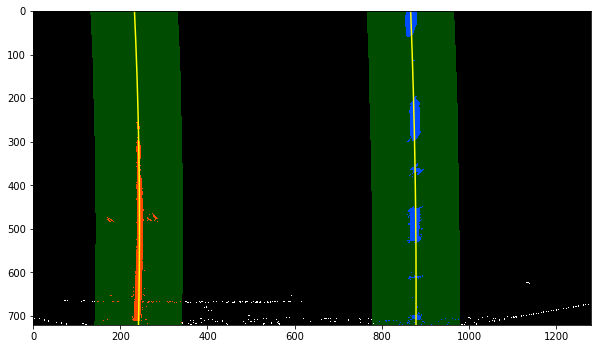

In [33]:
def Visualize_Lane_Detection(binary, left_fit,right_fit, left_lane, right_lane,out_img):
    margin = 100
    nonzero = binary.nonzero()
    nonzero_y = np.array(nonzero[0])
    nonzero_x = np.array(nonzero[1])
    out_img[nonzero_y[left_lane], nonzero_x[left_lane]] = [255, 0, 0]
    out_img[nonzero_y[right_lane], nonzero_x[right_lane]] = [0, 0, 255]
    ploty = np.linspace(0, binary.shape[0]-1, binary.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty +left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
   
    
 
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary, binary, binary))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzero_y[left_lane], nonzero_x[left_lane]] = [255, 0, 0]
    out_img[nonzero_y[right_lane], nonzero_x[right_lane]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    
    
    plt.figure(figsize=(10,10))
    plt.imshow(result)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)

l,r,ld,rd,o=window_search(combinedImage, plot=False)
Visualize_Lane_Detection(combinedImage,l,r,ld,rd,o)


In [34]:
def DrawLine(original_image,binary, left_fit, right_fit):
    src=np.float32([[150,720],[590,450],[700,450],[1250,720]]) # Source Points for Image Warp
    dst= np.float32([[200 ,720], [200  ,0], [980 ,0], [980 ,720]]) # Destination Points for Image Warp
    h,w= binary.shape
    Minv = cv2.getPerspectiveTransform(dst, src)
    ploty = np.linspace(0, binary.shape[0]-1, binary.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty +left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2] 
    zeros = np.zeros_like(binary).astype(np.uint8)
    color_warp = np.dstack((zeros, zeros, zeros))
    
   
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    #axes[index+1].imshow(newwarp)
    # Combine the result with the original image
    result = cv2.addWeighted(original_image, 1, newwarp, 0.5, 0)
    return result


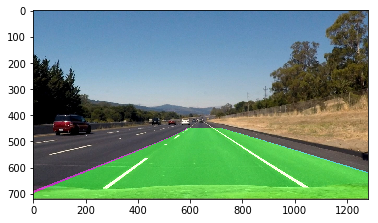

In [35]:

# Test it
image = cv2.imread('test_images/straight_lines2.jpg')
#combined=combined_gradthresh(image)
originalImage=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
combinedImage=combined_finalbinarythresh(originalImage)
returnedOutput =  window_search(combinedImage)
left_fit=returnedOutput[0]
right_fit=returnedOutput[1]
finalImage=DrawLine(originalImage,combinedImage,left_fit,right_fit)
plt.imshow(finalImage)


In [36]:

def CalculateRadiusOfCurvature(binary,left_fit,right_fit):
    ym = 30/720 # meters per pixel in y dimension
    xm = 3.7/700 # meters per pixel in x dimension
    
    ploty = np.linspace(0, binary.shape[0]-1, binary.shape[0] )
    leftx = left_fit[0]*ploty**2 + left_fit[1]*ploty +left_fit[2]
    rightx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    car_position= binary.shape[1]/2
    
    # Fit new polynomials to x,y 
    left_fit_cr = np.polyfit(ploty*ym, leftx*xm, 2)
    right_fit_cr = np.polyfit(ploty*ym, rightx*xm, 2)
    
    # Calculate the new radius of curvature
    y_eval=np.max(ploty)
    
    left_curve_radius = ((1 + (2*left_fit_cr[0]*y_eval*ym + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curve_radius = ((1 + (2*right_fit_cr[0]*y_eval*ym + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        
    left_lane_bottom = (left_fit[0]*y_eval)**2 + left_fit[0]*y_eval + left_fit[2]
    right_lane_bottom = (right_fit[0]*y_eval)**2 + right_fit[0]*y_eval + right_fit[2]
    
    actual_position= (left_lane_bottom+ right_lane_bottom)/2
    
    distance= (car_position - actual_position)* xm
    
    return (left_curve_radius + right_curve_radius)/2, distance

In [37]:
from random import randint
import datetime
import time

def pipeline(originalImage):
    originalImage= cv2.cvtColor(originalImage, cv2.COLOR_BGR2RGB)
    undistortedImage= cal_undistort(originalImage)
    warpedImage= warp_img(undistortedImage)
    combinedImage= combined_finalbinarythresh(warpedImage)
    returnedOutput =  window_search(combinedImage)
    left_fit=returnedOutput[0]
    right_fit=returnedOutput[1]
    
    finalImage=DrawLine(originalImage,combinedImage,left_fit,right_fit)
       
    radius, distance = CalculateRadiusOfCurvature(combinedImage,left_fit,right_fit)
    cv2.putText(finalImage,"Radius of Curvature is " + str(int(radius))+ "m", (100,100), 2, 1, (255,255,0),2)
    
    if distance > 0:
        cv2.putText(finalImage,"Vehicle is {:2f}".format(distance)+ "m right of center", (100,150), 2, 1, (255,255,0),2)
    else:
         cv2.putText(finalImage,"Vehicle is {:2f}".format(-1*distance)+ "m left of center", (100,150), 2, 1, (255,255,0),2)
            
    ts = time.time()
    st = datetime.datetime.fromtimestamp(ts).strftime('%Y%m%d %H%M%S')
        
    cv2.imwrite('./Output_1/'+str(st)+'.jpg',originalImage)
    
    cv2.imwrite('./Output_1/'+str(st)+'_o.jpg',finalImage)
    newCombinedImage= np.dstack((combinedImage*255,combinedImage*255,combinedImage*255))
    finalImage[100:240,1000:1200, :]= cv2.resize(newCombinedImage, (200,140))
    return cv2.cvtColor(finalImage, cv2.COLOR_BGR2RGB)

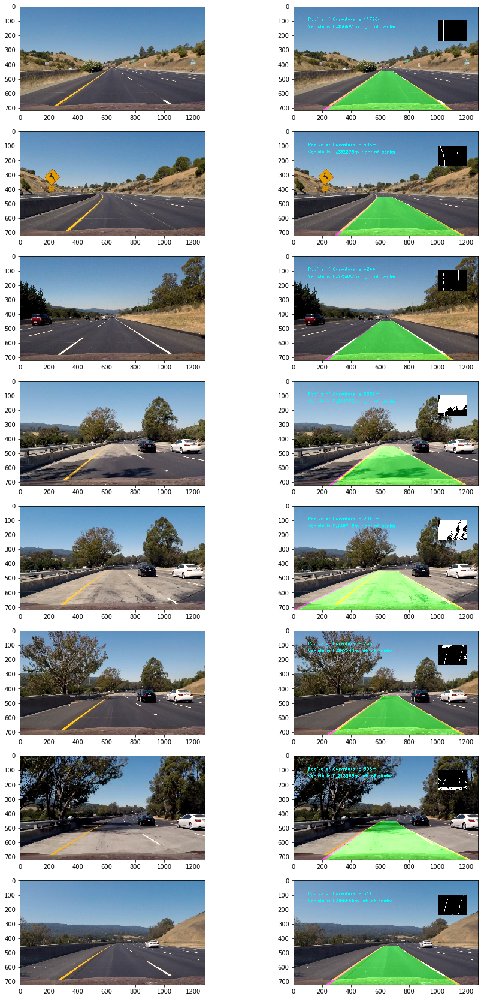

In [38]:

fig, axes= plt.subplots(8,2,figsize=(15,30))

images = glob.glob('test_images/*.jpg') # Reading Images from test_images folder

for index, image in enumerate(images):
    originalImage= cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB)
    finalImage=pipeline(originalImage)
    cv2.imwrite('output_images/'+str(index)+'.jpg', cv2.cvtColor(finalImage,cv2.COLOR_BGR2RGB))
    axes[index,0].imshow(originalImage)
    axes[index,1].imshow(finalImage)

In [39]:

import moviepy
from moviepy.editor import VideoFileClip
video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')
processed_video = video_input1.fl_image(pipeline)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [32:47<00:01,  1.53s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 28min 45s, sys: 1min 53s, total: 30min 39s
Wall time: 32min 50s


In [40]:

import moviepy
from moviepy.editor import VideoFileClip
video_output1 = 'harder_challenge_video_output.mp4'
video_input1 = VideoFileClip('harder_challenge_video.mp4')
processed_video = video_input1.fl_image(pipeline)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


100%|█████████▉| 1199/1200 [31:36<00:01,  1.56s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

CPU times: user 27min 49s, sys: 1min 6s, total: 28min 56s
Wall time: 31min 40s
